# Import and set colors

In [1]:
#Import packages
import scanpy as sc
import anndata as ann
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import cm, colors
from gprofiler import gprofiler

import os 

import seaborn as sb

In [2]:
plt.rcParams['figure.figsize']=(5,5) #rescale figures
sc.settings.verbosity = 3
sc.set_figure_params(scanpy=True, dpi=100, dpi_save=300,transparent=False, fontsize=16, color_map='plasma')
sc.logging.print_header()

scanpy==1.7.1 anndata==0.7.6 umap==0.5.1 numpy==1.22.3 scipy==1.8.0 pandas==1.2.3 scikit-learn==0.24.1 statsmodels==0.12.2 python-igraph==0.8.3 louvain==0.7.0 leidenalg==0.8.3 pynndescent==0.5.4


In [3]:
#Define a nice colour map for gene expression
colors2 = plt.cm.plasma(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colorsComb = np.vstack([colors3, colors2])
mymap2 = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

In [4]:
con_cl= ['#DC143C', '#20B2AA']

# Set project file paths

In [5]:
file_path = '/Volumes/Seagate_Exp/Paper_sc_analysis/notebooks/analysis_early_time_points/040522_corrected_notebooks/Revision/' 
#this is my file path please adapt it to your directory

In [6]:
data_dir = file_path + 'data/' 

In [7]:
table_dir = file_path + 'tables/'

In [8]:
sc.settings.figdir = file_path + 'figures/'

In [9]:
import datetime

today = datetime.date.today().strftime('%y%m%d') #creates a YYMMDD string of today's date

# Read Data & downstream analysis

In [10]:
adata_postnorm = sc.read("/Volumes/Seagate_Exp/Paper_sc_analysis/notebooks/analysis_early_time_points/040522_corrected_notebooks/Revision/data/230516data_postnorm_all_earlytp.h5ad")

## Select Intact and injury samples

In [11]:
adata_ctr_proc = adata_postnorm[np.in1d(adata_postnorm.obs['condition'], 
                           ['3dpi_CTRL', '5dpi_CTRL', 'INTACT'])].copy()

In [12]:
adata_ctr_proc.obs['condition'].value_counts()

INTACT       16965
5dpi_CTRL    15898
3dpi_CTRL     3646
Name: condition, dtype: int64

In [13]:
# scale and store results in layer
adata_ctr_proc.layers['scaled'] = sc.pp.scale(adata_ctr_proc, copy=True).X

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


# Analyse only 3dpi

In [14]:
set(adata_ctr_proc.obs['batch'])

{1, 2, 3, 4, 5}

In [15]:
adata_ctr_proce3dpi = adata_ctr_proc[np.in1d(adata_ctr_proc.obs['batch'], 
                           [1])].copy()

In [16]:
adata_ctr_proce3dpi.obs['condition'].value_counts()

3dpi_CTRL    3646
INTACT       2676
Name: condition, dtype: int64

## Highly Variable Genes

In [17]:
sc.pp.highly_variable_genes(adata_ctr_proce3dpi, flavor='cell_ranger', n_top_genes=2000,batch_key='batch')
print('\n','Number of highly variable genes: {:d}'.format(np.sum(adata_ctr_proce3dpi.var['highly_variable'])))

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)

 Number of highly variable genes: 2000


/opt/anaconda3/envs/sc_tutorial_020321_scvi_040523/lib/python3.8/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


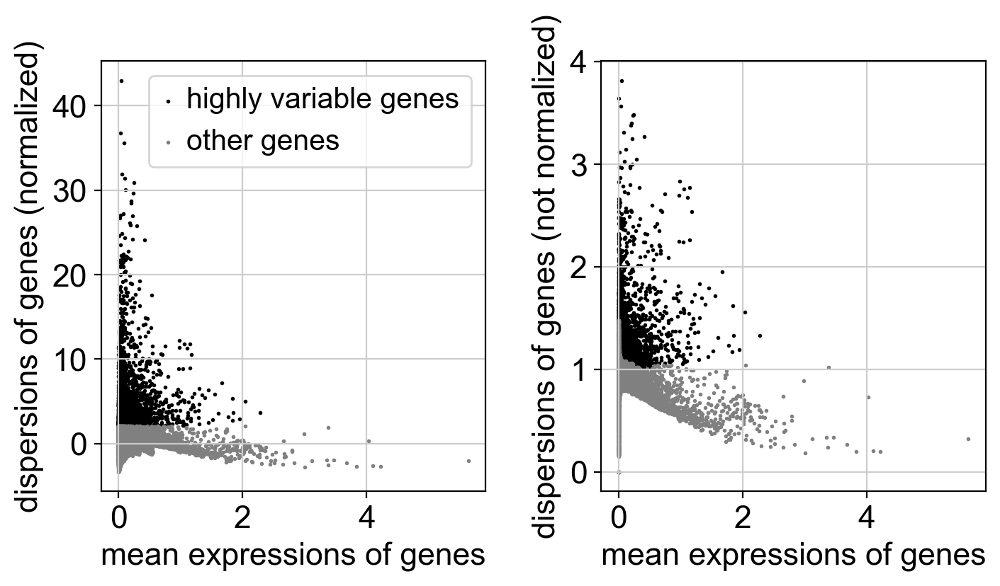

In [18]:
sc.pl.highly_variable_genes(adata_ctr_proce3dpi)

## Visualization

In [19]:
sc.pp.pca(adata_ctr_proce3dpi, n_comps=50, use_highly_variable=True, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)


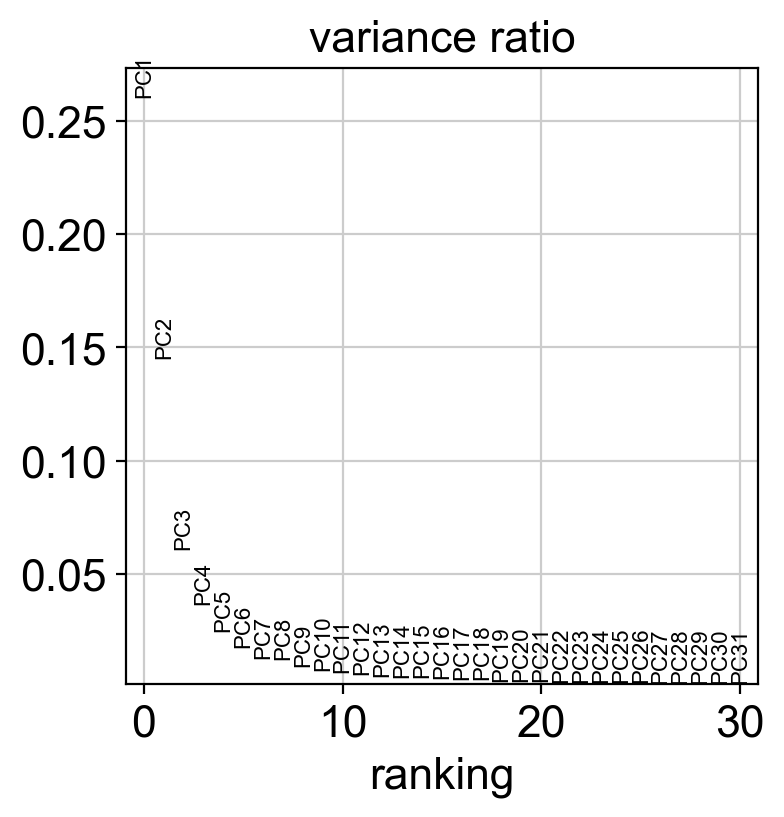

In [20]:
sc.pl.pca_variance_ratio(adata_ctr_proce3dpi)

In [21]:
sc.pp.pca(adata_ctr_proce3dpi, n_comps=11, use_highly_variable=True, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=11
    finished (0:00:00)


In [22]:
sc.pp.neighbors(adata_ctr_proce3dpi, n_neighbors=30)

computing neighbors
    using 'X_pca' with n_pcs = 11


OMP: Info #271: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)


In [23]:
sc.tl.umap(adata_ctr_proce3dpi,min_dist=0.9)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:09)


In [24]:
sc.tl.leiden(adata_ctr_proce3dpi, resolution=1.3,key_added='leiden13')


running Leiden clustering
    finished: found 25 clusters and added
    'leiden13', the cluster labels (adata.obs, categorical) (0:00:00)


In [25]:
sc.tl.leiden(adata_ctr_proce3dpi, resolution=2,key_added='leiden2')


running Leiden clustering
    finished: found 30 clusters and added
    'leiden2', the cluster labels (adata.obs, categorical) (0:00:00)


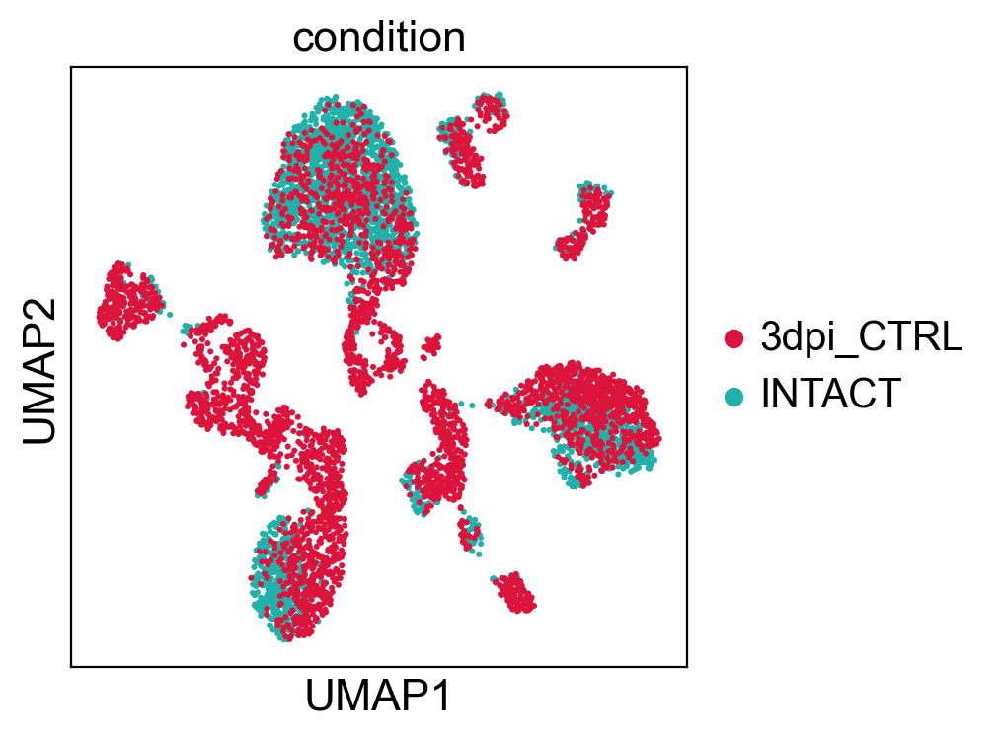

In [26]:
sc.pl.umap(adata_ctr_proce3dpi, color = ['condition',], palette=con_cl)

In [27]:
adata_ctr_proce3dpi

AnnData object with n_obs × n_vars = 6322 × 19290
    obs: 'sample_id', 'condition', 'batch', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mt_frac', 'n_counts', 'n_genes', 'doublet_score', 'doublet', 'size_factors', 'leiden13', 'leiden2'
    var: 'gene_ids', 'feature_types', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'sample_id_colors', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'condition_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts', 'counts_lognorm', 'scaled'
    obsp: 'distances', 'connectivities'

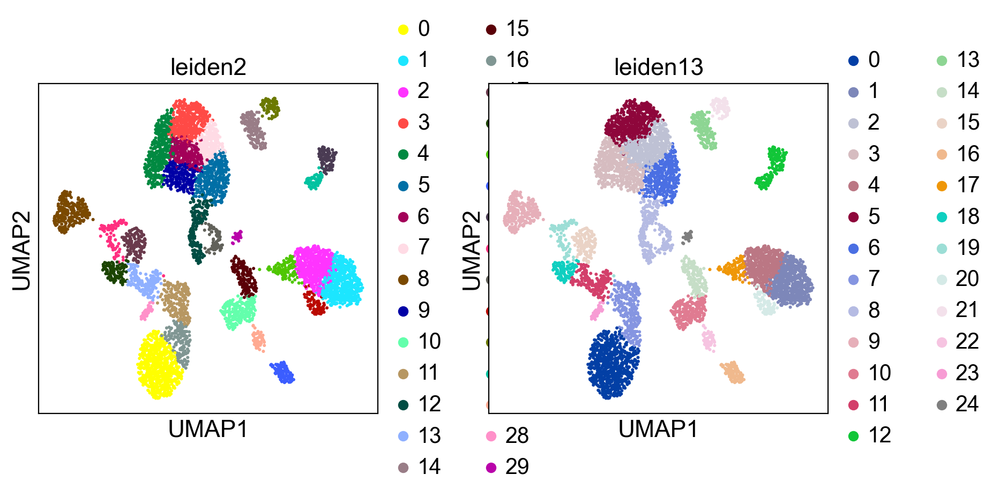

In [28]:
sc.pl.umap(adata_ctr_proce3dpi, color = ['leiden2','leiden13'],)

In [29]:
#Calculate marker genes check for 100 use raw data for markers
sc.tl.rank_genes_groups(adata_ctr_proce3dpi, groupby='leiden2', key_added='rank_genes_ctr_r2', method='t-test_overestim_var')

ranking genes
    finished: added to `.uns['rank_genes_ctr_r2']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)


    using 'X_pca' with n_pcs = 11
Storing dendrogram info using `.uns['dendrogram_leiden2']`


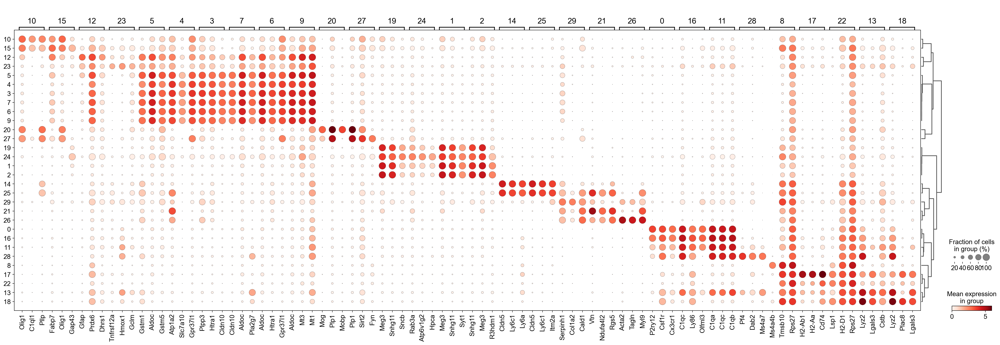

In [30]:
#it uses adata_main_correct.raw which is set to adata, so the results should be similar to the mgs from adata that I think they are
sc.pl.rank_genes_groups_dotplot(adata_ctr_proce3dpi, n_genes=3, key='rank_genes_ctr_r2', )

In [31]:
mg = []
scores = []
for i in range(0,25):
    mg = [j[i] for j in adata_ctr_proce3dpi.uns['rank_genes_ctr_r2']['names']][:50]
    scores = [j[i] for j in adata_ctr_proce3dpi.uns['rank_genes_ctr_r2']['scores']][:50]
    print('marker genes in louvain cluster: ' + str(i))
    for j in range (0,len(mg)):
        print(mg[j])
    print('-----------------')

marker genes in louvain cluster: 0
P2ry12
Csf1r
Cx3cr1
Gpr34
Hexb
Tmem119
Selplg
Trem2
Siglech
Olfml3
C1qc
C1qa
Lpcat2
Fcrls
C1qb
Vsir
Fcgr3
Rgs10
Ctss
Laptm5
Unc93b1
Sparc
Lgmn
Serinc3
Ctsd
Ly86
Ltc4s
Rnase4
Rhob
Cd53
Pld4
P2ry13
Ptgs1
Lag3
Slc2a5
Tyrobp
Trf
Aif1
AF251705
Fcer1g
Zfp36
Hpgds
Jun
F11r
Grn
Marcks
Cd68
Ier5
Itgb5
Hexa
-----------------
marker genes in louvain cluster: 1
Meg3
Snhg11
Syt1
Rtn1
Syp
Clstn1
Slc17a7
Camk2a
Pcsk2
Atp2b2
Lingo1
Grin2b
Scn2a1
Ptprd
R3hdm1
C1qtnf4
Kalrn
App
Cck
Olfm1
Atp1a1
Tmem59l
Nptxr
Arpp21
Kif1a
Atp1a3
Mef2c
Snap25
Faim2
Ttc3
Clstn3
Kif5c
Dnm1
Frrs1l
Atp1b1
Stx1a
Slc12a5
Gabrg2
mt-Nd1
Tmem151a
Ptprn
Gabra1
Celf4
Tmem132a
2900055J20Rik
Syt4
Cbarp
Ndrg4
Pcsk1n
Nell2
-----------------
marker genes in louvain cluster: 2
Snhg11
Meg3
R3hdm1
Ptprd
Syt1
Kalrn
Rtn1
Camk2a
mt-Nd1
Arpp21
Atp1a1
Atp2b2
Mef2c
Pcsk2
Snap25
Grin2b
2900055J20Rik
Cck
Brinp3
Slc17a7
C1qtnf4
Gria2
Clstn1
Syp
Scn2a1
Tmem191c
Ttc14
Nrxn1
Pcsk1n
Frrs1l
Olfm1
Ttc3
App
Kcnq1ot1
mt-Nd

In [32]:
Markers_all_cells ={'Microglia': ['Tmem119', 'Cx3cr1', 'P2ry12', 'P2ry13', 'Gpr34', 'Olfml3', 'Selplg', 'Sparc', 'Fcrls', 'Siglech', 'Slc2a5','Mafb', 'Pmepa1', 'Cd14'],
                   'DAM':['Lpl','Cst7'], 
                   'Macrophages':['Itga4', 'Tgfbi', 'Ifitm2', 'Ifitm3', 'Tagln2','F13a1', 'Kynu', 'S100a11', 'S100a6'],
                   'BAM': [ 'Cd163', 'Mrc1','Lyve1', 'Siglec1'],
                   'Monocytes':['Ly6c2','Ccr2','Spn'],
                   'DCs':['Cd24a','Itgax','Bst2','Cd209a','Xcr1','Ccr7','Ccr9', 'Flt3','Itgae', 'Itgam','H2-Oa','Tnni2','Kctd14','Amica1','Kmo','Hepacam2'], 
                   'NKT cells':['Cd3e','Klrb1c','Ncr1'],
                   'T cells':['Cd3d','Cd3e','Cd3g','Lat','Bcl11b'],
                   'B cells':['Cd19', 'Ms4a1', 'Sdc1', 'Pax5', 'Ms4a1'],
                   'Neutrophils': ['S100a9'],
                   'Neurons':['Rbfox3','Slc17a7','Gabra1', 'Cux1','Pou3f2','Bcl11b', 'Foxp2'],
                   'OPCs':['Pdgfra', 'C1ql1'],
                   'COPs':['Neu4', 'Brca1'],
                   'MOL':['Opalin', 'Ninj2'],
                   'Astrocytes':['Sox9', 'Gfap','Aldh1l1','Atp1b2', 'Vim','Gfap','Slc1a3','Aldoc'],
                   'Pericytes':['Pecam1','Pdgfrb', 'Higd1b','Ndufa4l2','Rgs5','Kcnj8','Flt1'],
                   'VSMCs':['Acta2', 'Tagln','Myh11', 'Mustn1','Map3k7cl'],
                   'VLMCs':['Mgp', 'Slc47a1',  'Thbd', 'Col1a1', 'Col1a2'],
                   'VECV': ['Ly6c1','Cldn5', 'Ly6a','Pltp','Pglyrp1', 'Scgb3a1']
                  }#Ochocka et al., 2021, van Hove et al., 2016, Zeisel et al. 2018

In [33]:
for names in list(Markers_all_cells):
    sc.tl.score_genes(adata_ctr_proce3dpi, Markers_all_cells[names], score_name=names )

computing score 'Microglia'
    finished: added
    'Microglia', score of gene set (adata.obs).
    250 total control genes are used. (0:00:00)
computing score 'DAM'
    finished: added
    'DAM', score of gene set (adata.obs).
    100 total control genes are used. (0:00:00)
computing score 'Macrophages'
    finished: added
    'Macrophages', score of gene set (adata.obs).
    300 total control genes are used. (0:00:00)
computing score 'BAM'
    finished: added
    'BAM', score of gene set (adata.obs).
    150 total control genes are used. (0:00:00)
computing score 'Monocytes'
    finished: added
    'Monocytes', score of gene set (adata.obs).
    149 total control genes are used. (0:00:00)
computing score 'DCs'
    finished: added
    'DCs', score of gene set (adata.obs).
    499 total control genes are used. (0:00:00)
computing score 'NKT cells'
    finished: added
    'NKT cells', score of gene set (adata.obs).
    100 total control genes are used. (0:00:00)
computing score 'T cells

In [34]:
adata_ctr_proce3dpi

AnnData object with n_obs × n_vars = 6322 × 19290
    obs: 'sample_id', 'condition', 'batch', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mt_frac', 'n_counts', 'n_genes', 'doublet_score', 'doublet', 'size_factors', 'leiden13', 'leiden2', 'Microglia', 'DAM', 'Macrophages', 'BAM', 'Monocytes', 'DCs', 'NKT cells', 'T cells', 'B cells', 'Neutrophils', 'Neurons', 'OPCs', 'COPs', 'MOL', 'Astrocytes', 'Pericytes', 'VSMCs', 'VLMCs', 'VECV'
    var: 'gene_ids', 'feature_types', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'sample_id_colors', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'condition_colors', 'leiden2_colo

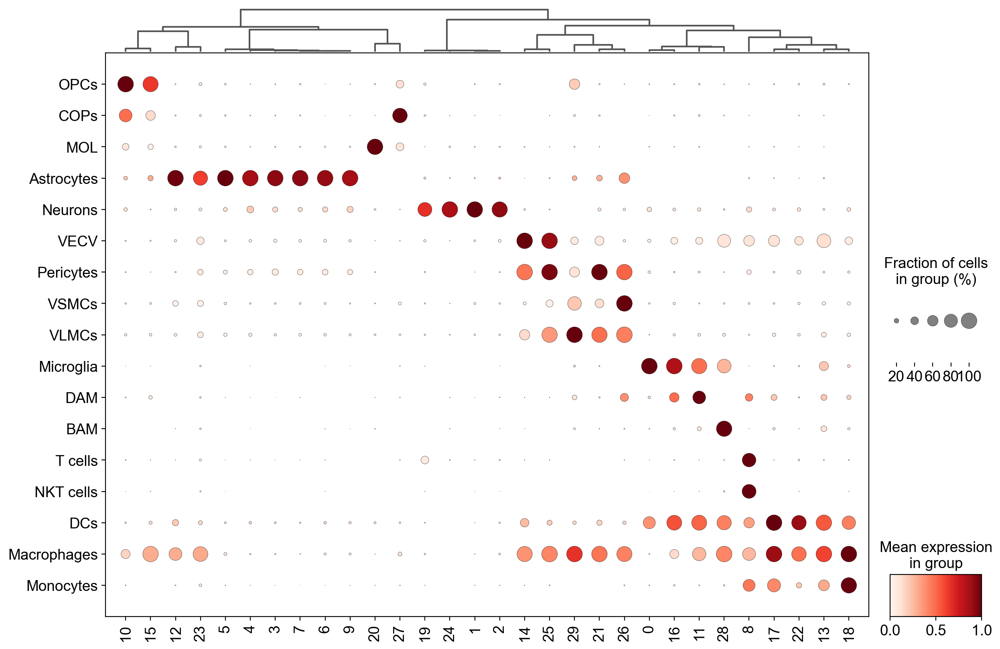

In [35]:
sc.pl.dotplot(adata_ctr_proce3dpi, ['OPCs','COPs', 'MOL',  'Astrocytes', 'Neurons','VECV','Pericytes', 'VSMCs', 'VLMCs',  'Microglia', 'DAM', 'BAM', 'T cells', 'NKT cells', 
                                    'DCs','Macrophages', 'Monocytes'], 'leiden2',  standard_scale='var', swap_axes=True, figsize=(14,10),
              var_group_rotation=90, dendrogram=True, save='markers_3dpi.png')

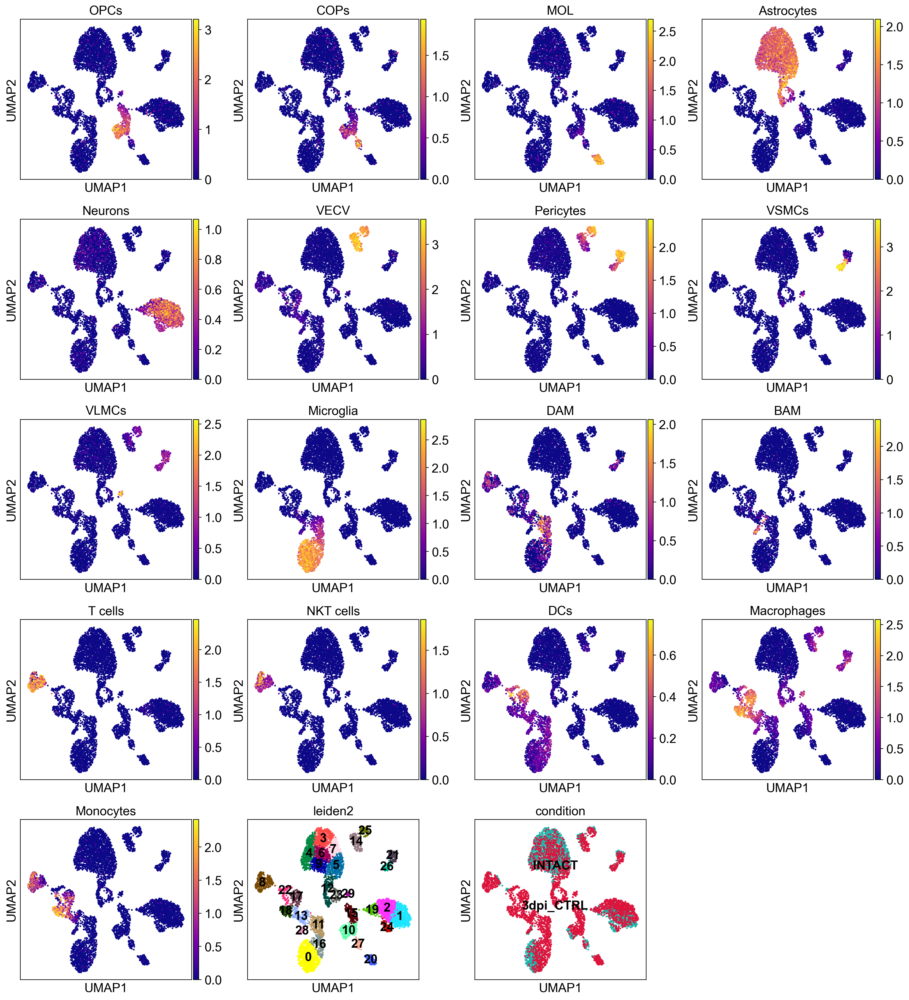

In [36]:
sc.pl.umap(adata_ctr_proce3dpi, color = ('OPCs','COPs', 'MOL',  'Astrocytes', 'Neurons','VECV','Pericytes', 'VSMCs', 'VLMCs',  'Microglia', 'DAM', 'BAM', 'T cells', 'NKT cells', 
                                    'DCs','Macrophages', 'Monocytes','leiden2','condition'), legend_loc='on data',vmin=0)

In [37]:
cluster2annotation = {'0': '0_Microglia',
                      '1': '1_Neurons',
                      '2': '2_Neurons',
                      '3': '3_Astrocytes',
                      '4': '4_Astrocytes',
                      '5': '5_Astrocytes',
                      '6': '6_Astrocytes',
                      '7': '7_Astrocytes',
                      '8': '8_NKT/T cells',
                      '9': '9_Astrocytes', 
                      '10': '10_OPCs',
                      '11': '11_Microglia',
                      '12': '12_Astrocytes',
                      '13': '13_Macrophages/Monocytes',
                      '14': '14_VECV',
                      '15': '15_OPCs', 
                      '16': '16_Microglia',
                      '17': '17_DCs',
                      '18': '18_Monocytes',
                      '19': '19_Neurons',
                      '20': '20_MOL',
                      '21': '21_Pericytes',
                      '22': '22_DCs',
                      '23': '23_Astrocytes', 
                      '24': '24_Neurons',
                      '25': '25_Pericytes',
                      '26': '26_VSMCs',
                      '27': '27_COPs',
                      '28': '28_BAM',
                      '29': '29_VLMCs'
                      
}

In [38]:
adata_ctr_proce3dpi.obs['annotated2'] = adata_ctr_proce3dpi.obs['leiden2'].map(cluster2annotation).astype('category')

In [39]:
color2 = ['#DC143C','#008000','#9AD255','#4169E1','#333399','#b3d9ff','#4da6ff','#7d87b9','#fdd2ce','#0066cc', '#e6007a',
          '#fb9084','#bdcbf5','#cc3333','#BA55D3','#fa9ef7','#f48aa0','#ff8c00','#ffbf00','#20B2AA','#FFB6C1','#9985e0',
          '#801a00','#80d4ff', '#8dd593','#DA0AD3','#d279a6','#ffb3db','#8e063b','#bf4080']

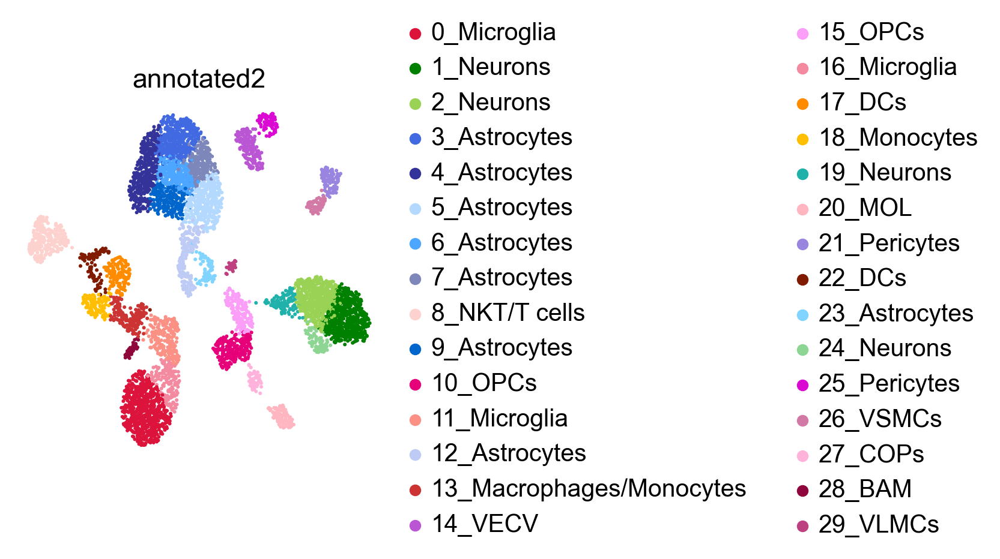

In [40]:
sc.pl.umap(adata_ctr_proce3dpi,  color = ('annotated2'),  legend_fontweight= 'bold', frameon= False , vmin=0, cmap=mymap2, legend_fontoutline=2,  palette= color2,
          )

In [41]:
#Calculate marker genes check for 100 use raw data for markers
sc.tl.rank_genes_groups(adata_ctr_proce3dpi, groupby='annotated2', key_added='rank_genes_ctr_ra2', method='t-test_overestim_var')

ranking genes
    finished: added to `.uns['rank_genes_ctr_ra2']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)


In [42]:
sc.tl.dendrogram(adata_ctr_proce3dpi,'annotated2')

    using 'X_pca' with n_pcs = 11
Storing dendrogram info using `.uns['dendrogram_annotated2']`


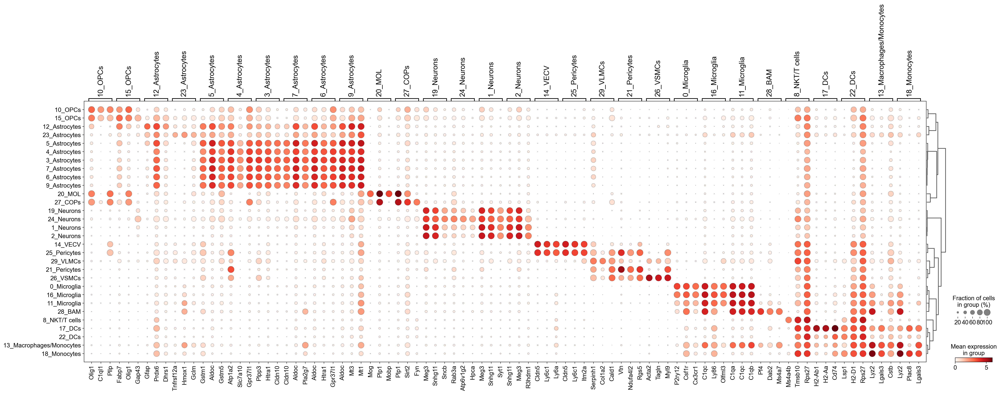

In [43]:
#it uses adata_main_correct.raw which is set to adata, so the results should be similar to the mgs from adata that I think they are
sc.pl.rank_genes_groups_dotplot(adata_ctr_proce3dpi, n_genes=3, key='rank_genes_ctr_ra2', save='_3dpi_intact.png' )

In [44]:
result = adata_ctr_proce3dpi.uns['rank_genes_ctr_ra2']
groups = result['names'].dtype.names
adata_adata_ctr_proce3dpi_genes = pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names','scores', 'pvals','logfoldchanges']})
 
 

In [45]:
adata_adata_ctr_proce3dpi_genes

,0_Microglia_n,0_Microglia_s,0_Microglia_p,0_Microglia_l,1_Neurons_n,1_Neurons_s,1_Neurons_p,1_Neurons_l,2_Neurons_n,2_Neurons_s,...,27_COPs_p,27_COPs_l,28_BAM_n,28_BAM_s,28_BAM_p,28_BAM_l,29_VLMCs_n,29_VLMCs_s,29_VLMCs_p,29_VLMCs_l
0,P2ry12,114.318527,0.000000e+00,7.443941,Meg3,58.717060,3.442479e-273,6.148770,Snhg11,56.580887,...,5.551445e-51,8.160872,Pf4,39.255497,6.940775e-56,9.252546,Serpinh1,12.982322,1.581666e-18,4.785357
1,Csf1r,93.688545,0.000000e+00,6.465540,Snhg11,57.770130,1.378221e-275,5.834428,Meg3,54.125446,...,1.800285e-47,5.713404,Dab2,28.837851,1.589897e-45,6.612854,Col1a2,12.929152,7.071817e-14,8.172394
2,Cx3cr1,91.269615,0.000000e+00,6.360211,Syt1,55.881039,6.297783e-305,4.503332,R3hdm1,42.888924,...,1.412185e-45,5.888808,Ms4a7,28.289907,6.397061e-45,7.354375,Cald1,12.595572,5.638100e-18,5.172075
3,Gpr34,91.262253,0.000000e+00,6.839336,Rtn1,52.870174,1.018499e-259,4.273099,Ptprd,39.224846,...,6.025171e-44,6.139697,Mrc1,20.416109,1.046958e-24,9.416023,Col1a1,12.583610,2.962172e-13,9.477234
4,Hexb,89.609848,0.000000e+00,6.784540,Syp,52.163258,6.807558e-301,4.313514,Syt1,38.255173,...,1.147507e-39,5.485935,Lyz2,18.540226,1.744177e-25,6.637699,Lgals1,11.890432,8.571682e-17,5.346969
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19285,Sparcl1,-26.520920,3.033356e-112,-4.035629,Rps23,-29.099209,7.731081e-134,-2.818031,Atp5e,-26.153637,...,2.115072e-09,-3.391546,Gpm6a,-6.611670,1.669865e-08,-3.684490,Atp6v0b,-5.574421,1.267508e-06,-2.087583
19286,Prnp,-27.435804,1.500057e-119,-3.863485,Prdx1,-29.617762,9.669224e-136,-3.185666,Prdx1,-26.416796,...,1.115440e-09,-4.178382,Sparcl1,-6.646616,2.043517e-08,-4.203490,Tspan7,-5.578942,2.998961e-06,-3.519309
19287,Ptn,-28.118721,2.041584e-122,-4.171202,Cst3,-30.729050,1.326570e-135,-3.346510,Cst3,-27.630991,...,1.184774e-10,-2.833133,Cadm1,-6.671848,2.539440e-08,-4.995230,Cadm1,-5.579951,5.112413e-06,-5.527568
19288,Gpm6b,-28.613810,7.659465e-125,-4.342147,Cd63,-32.801010,3.744238e-146,-4.699493,Cd63,-28.710545,...,2.621580e-11,-4.515301,Ldhb,-7.194376,1.223632e-09,-3.661607,Psap,-5.606011,6.990844e-07,-2.074276


In [46]:
adata_adata_ctr_proce3dpi_genes.to_csv(table_dir + 'adata_adata_ctr_proce3dpi_genes.csv')

In [47]:
sc.set_figure_params(facecolor="white", figsize=(5, 5),fontsize=16, dpi_save=300, dpi=100)

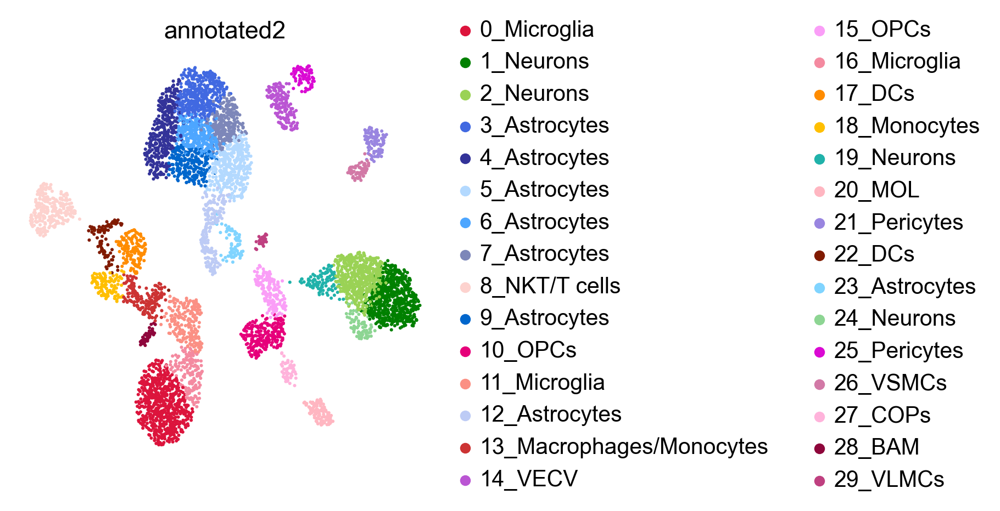

In [48]:
sc.pl.umap(adata_ctr_proce3dpi,  color = ('annotated2'),  legend_fontweight= 'bold', frameon= False , vmin=0, cmap=mymap2, legend_fontoutline=2,  palette= color2,
          save=today+names+'anno2.png')

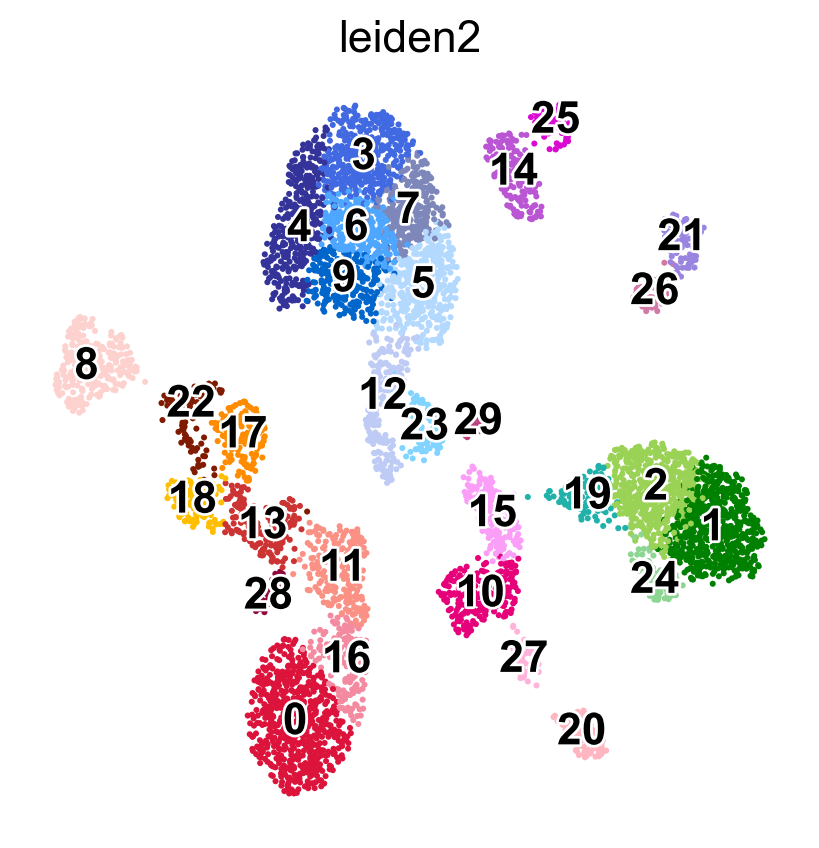

In [49]:
sc.pl.umap(adata_ctr_proce3dpi, legend_loc='on data', color = ('leiden2'),  legend_fontweight= 'bold', frameon= False , vmin=0, palette= color2, legend_fontoutline=2, 
          save=today+'leiden2.png')

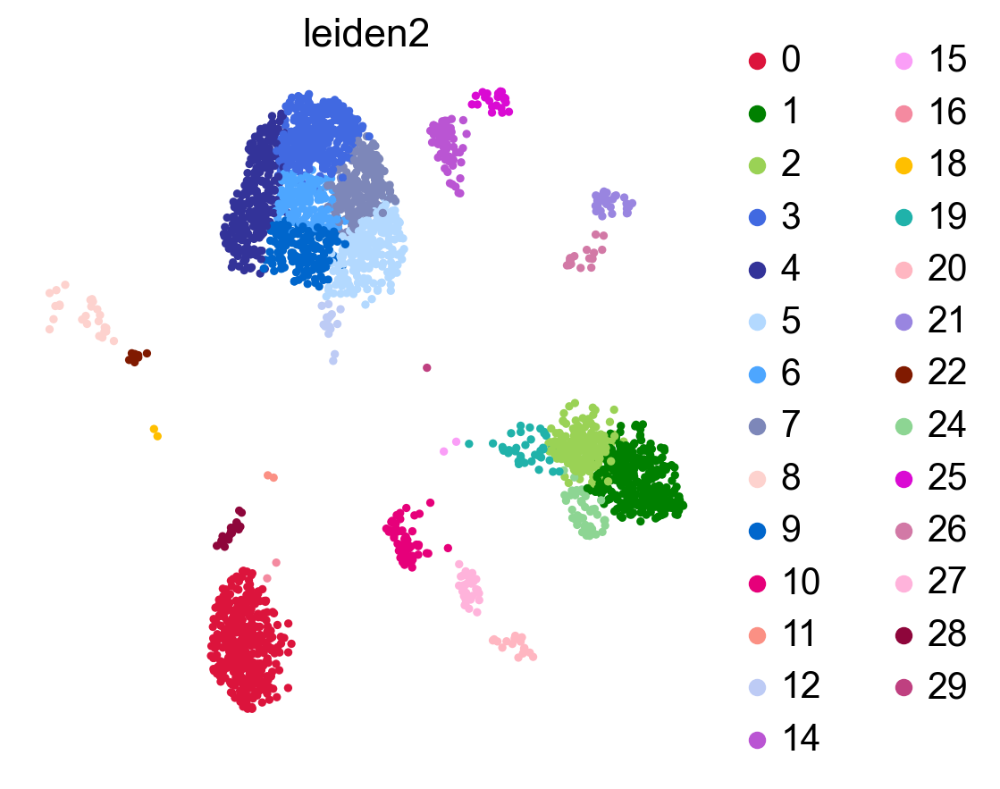

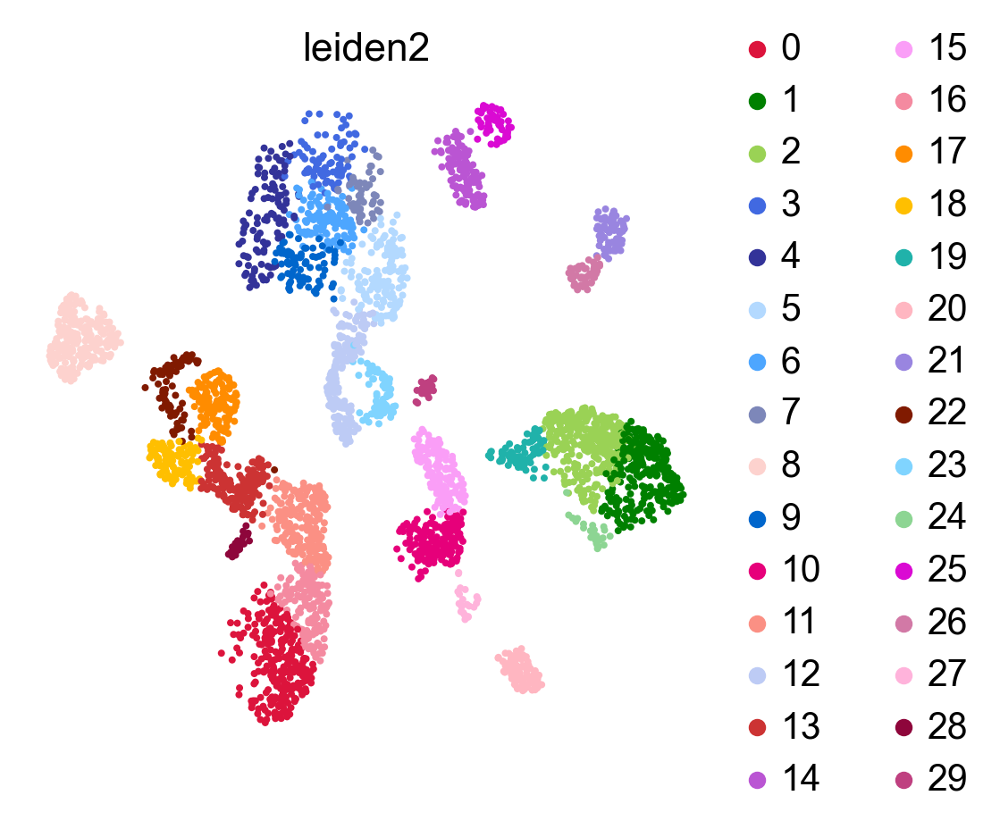

In [50]:
for names in set(adata_ctr_proce3dpi.obs['condition']):
    sc.pl.umap(adata_ctr_proce3dpi[np.in1d(adata_ctr_proce3dpi.obs['condition'], [names])], color = ('leiden2'),  legend_fontweight= 'bold', frameon= False , vmin=0, cmap=mymap2, legend_fontoutline=1, 
               save=today+names+'condition.png')

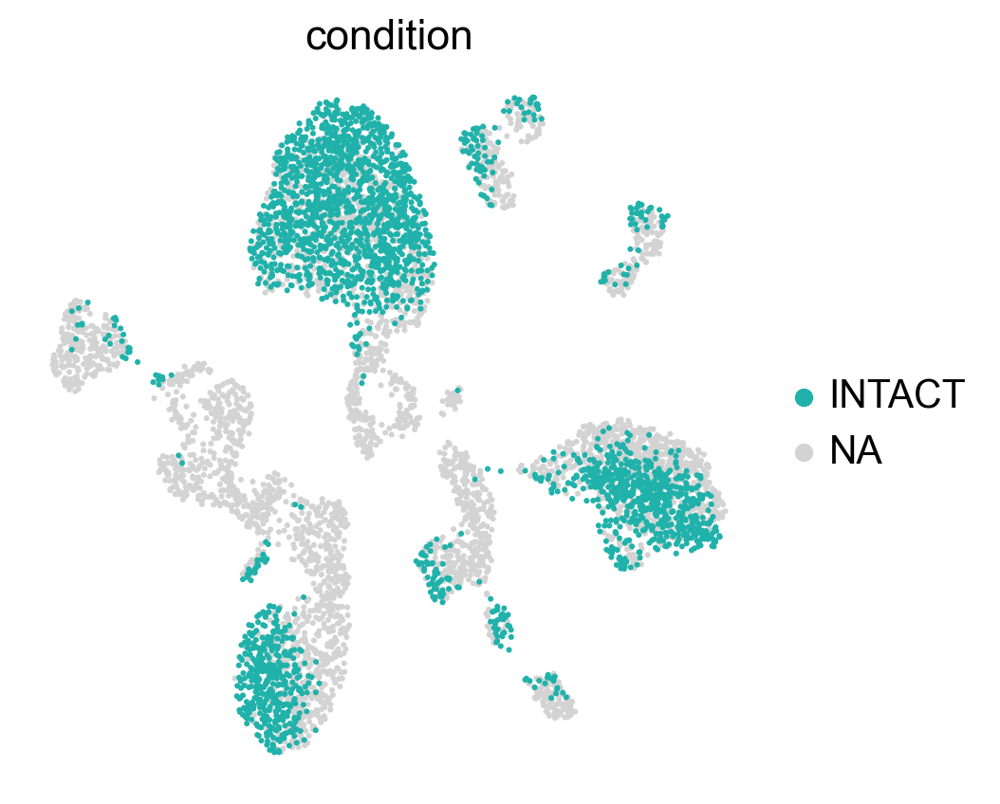

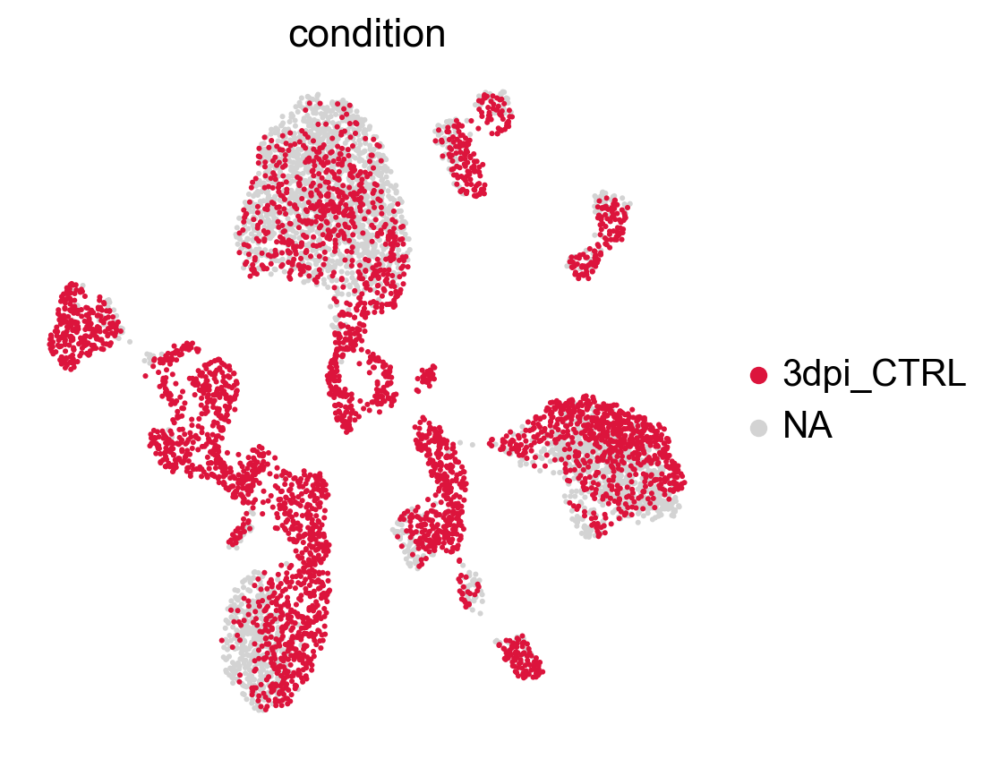

In [51]:
for names in set(adata_ctr_proce3dpi.obs['condition']):
    sc.pl.umap(adata_ctr_proce3dpi, color = ('condition'), groups=names, legend_fontweight= 'bold', frameon= False , vmin=0, cmap=mymap2, legend_fontoutline=1, palette=con_cl,
               save=today+names+'condition.png')

## Cell cycle

In [52]:
cell_cycle_genes = [x.strip() for x in open('/Volumes/Seagate_Exp/Single_cell_112020/regev_lab_cell_cycle_genes_mouse.txt')]

In [53]:
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
cell_cycle_genes = [x for x in cell_cycle_genes if x in adata_ctr_proce3dpi.var_names]

In [54]:
sc.tl.score_genes_cell_cycle(adata_ctr_proce3dpi, s_genes=s_genes, g2m_genes=g2m_genes)

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    645 total control genes are used. (0:00:00)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    725 total control genes are used. (0:00:00)
-->     'phase', cell cycle phase (adata.obs)


In [55]:
pair2= ["#009B77", "#ff8080", "#ffbf00", "#9AD255", "#9AD255",
       "#b30047",   "#dada2b", "#dada2b"]

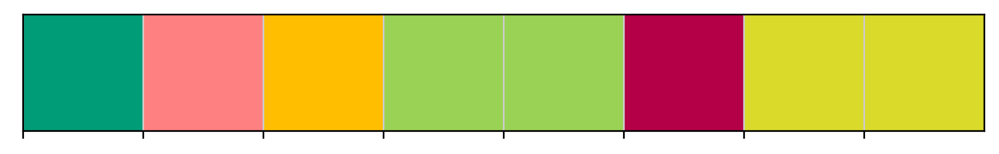

In [56]:
sb.palplot(pair2)

... storing 'phase' as categorical


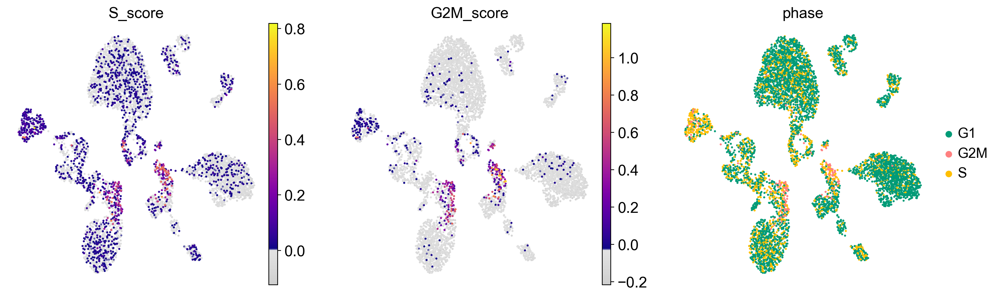

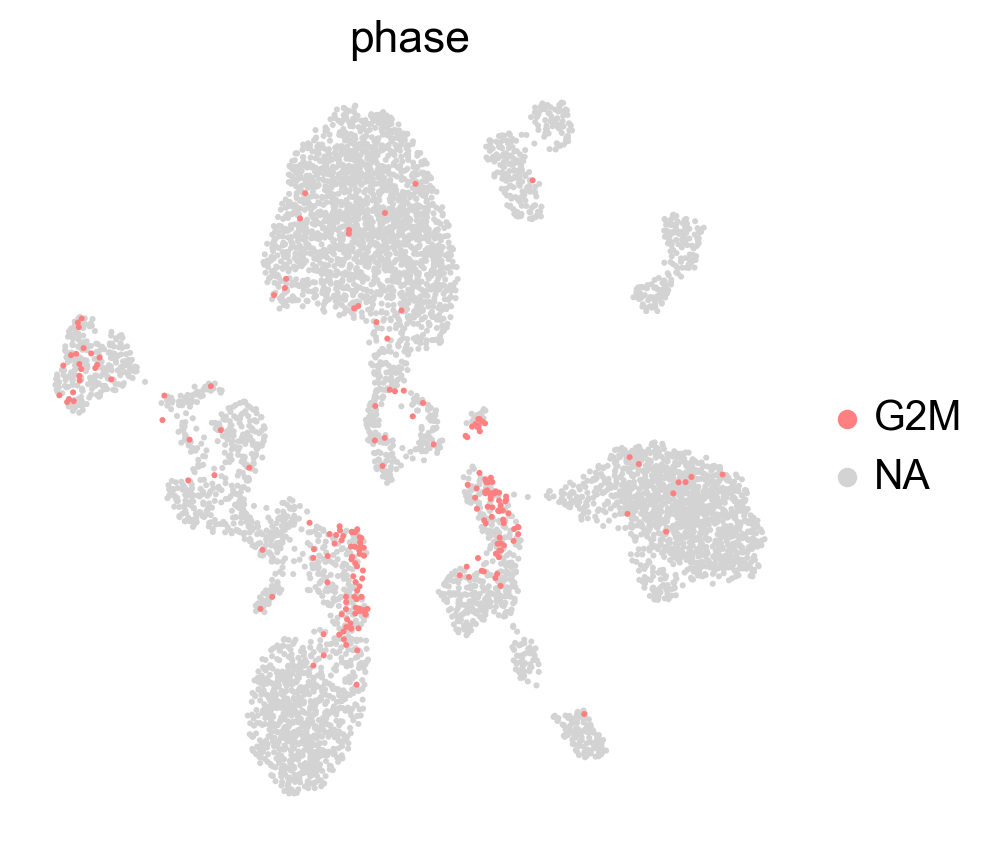

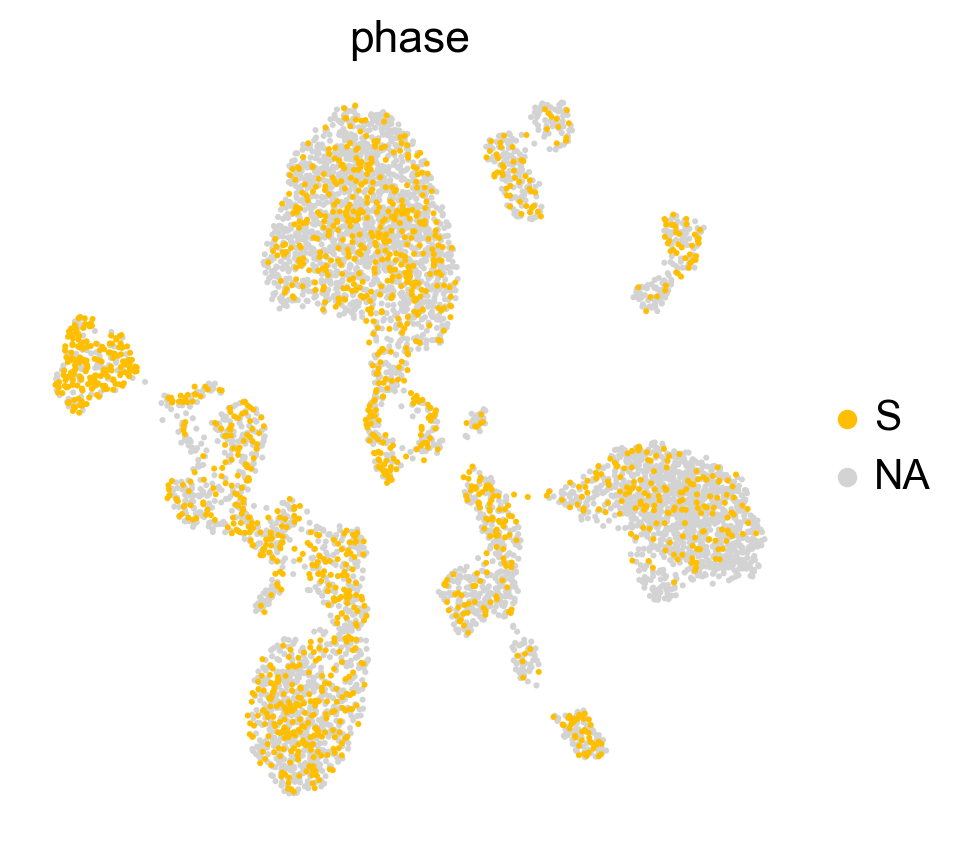

In [57]:
sc.pl.umap(adata_ctr_proce3dpi, color=['S_score', 'G2M_score', 'phase'],palette=pair2, use_raw=False, frameon=False, cmap=mymap2)
sc.pl.umap(adata_ctr_proce3dpi, color='phase',groups=['G2M'],  palette=pair2, use_raw=False, frameon=False)
sc.pl.umap(adata_ctr_proce3dpi, color='phase',groups=['S'],  palette=pair2, use_raw=False, frameon=False)

In [58]:
sc.tl.score_genes(adata_ctr_proce3dpi, list(cell_cycle_genes), score_name='Cycling cells' )

computing score 'Cycling cells'
    finished: added
    'Cycling cells', score of gene set (adata.obs).
    946 total control genes are used. (0:00:00)


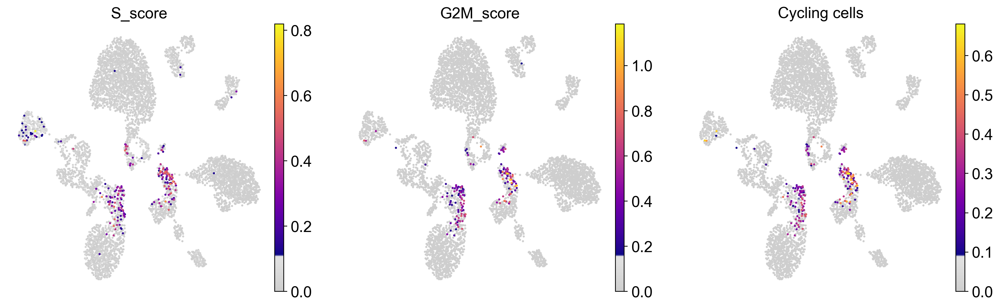

In [59]:
sc.pl.umap(adata_ctr_proce3dpi, color=['S_score', 'G2M_score', 'Cycling cells'],palette=pair2, use_raw=False, frameon=False, cmap=mymap2, vmin=0)

In [60]:
Ccc = adata_ctr_proce3dpi.obs['Cycling cells'] >0

In [61]:
Ccc

AAACCTGAGCGATTCT      False
AAACCTGAGGCGATAC      False
AAACCTGCAAACAACA      False
AAACCTGCAAGCTGTT      False
AAACCTGTCTGAAAGA      False
                      ...  
TTTGGTTTCGCCGTGA_1    False
TTTGTCAAGGTAGCCA      False
TTTGTCACAAGCGCTC      False
TTTGTCACAGTAACGG      False
TTTGTCAGTGGCAAAC      False
Name: Cycling cells, Length: 6322, dtype: bool

In [62]:
adata_ctr_proce3dpi.obs['cell_cycle'] = Ccc
adata_ctr_proce3dpi.obs['cell_cycle'] = adata_ctr_proce3dpi.obs['cell_cycle'].astype('category')

In [63]:
cluster2annotation = {
    False : 'resting',
    True : 'cycling',
 }

In [64]:
adata_ctr_proce3dpi.obs['cell_cycle'] = adata_ctr_proce3dpi.obs['cell_cycle'].map(cluster2annotation).astype('category')

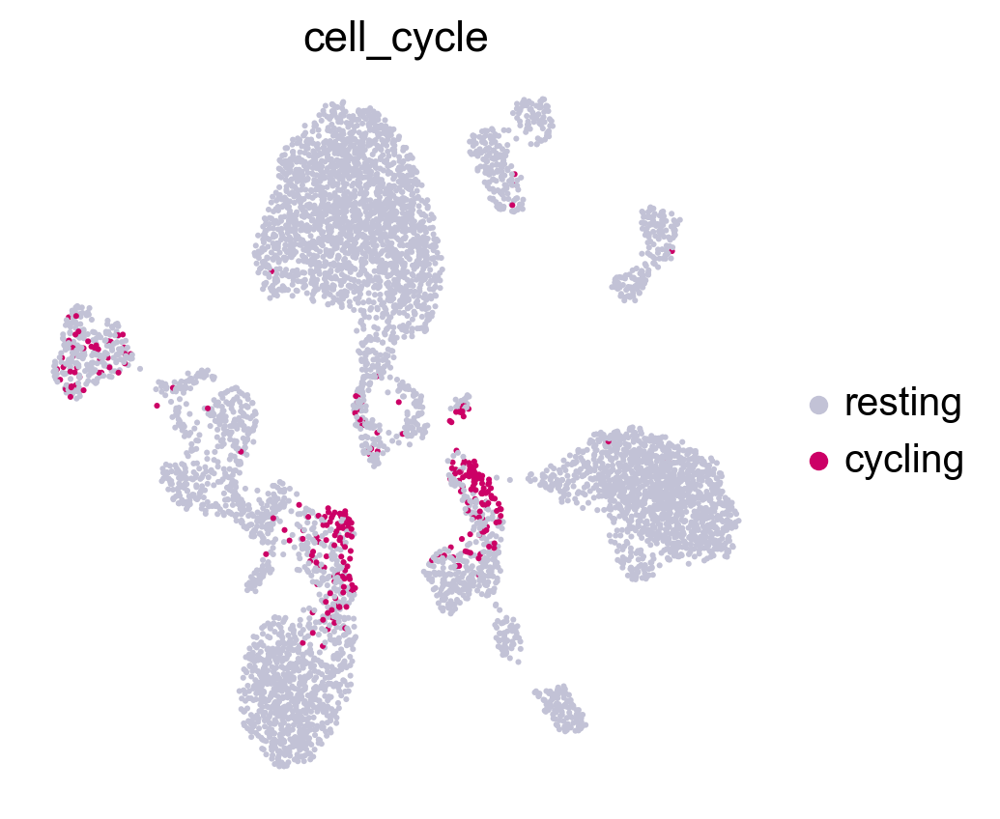

In [65]:
sc.pl.umap(adata_ctr_proce3dpi, color=['cell_cycle'],palette=['#c2c2d6', '#cc0066'], use_raw=False, frameon=False, cmap=mymap2, vmin=0)

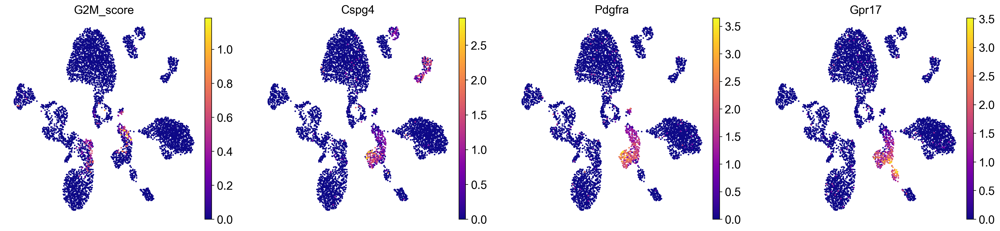

In [66]:
sc.pl.umap(adata_ctr_proce3dpi, color = ('G2M_score', 'Cspg4','Pdgfra','Gpr17' ),  legend_fontweight= 'bold', frameon= False , vmin=0,  legend_fontoutline=1, 
          )# save=today+'g2ms.png')

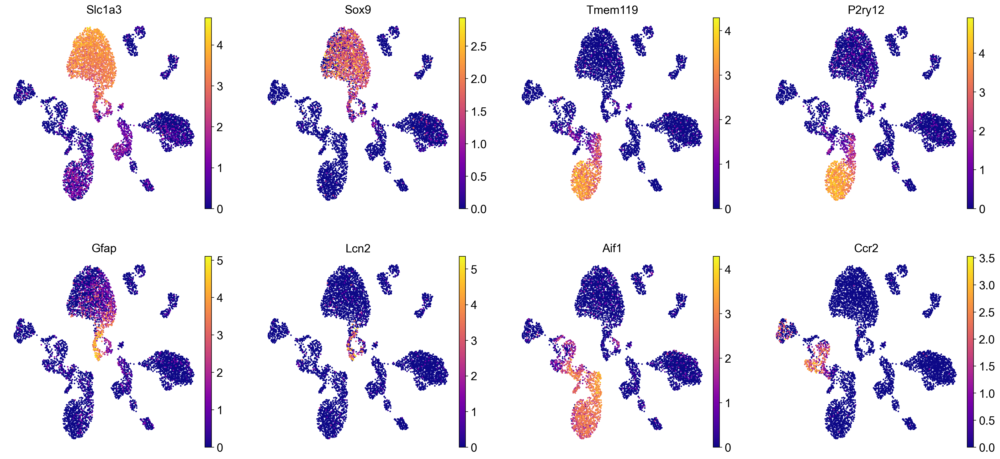

In [67]:
sc.pl.umap(adata_ctr_proce3dpi, color = ('Slc1a3','Sox9','Tmem119','P2ry12', 'Gfap', 'Lcn2', 'Aif1','Ccr2'),  legend_fontweight= 'bold', frameon= False , vmin=0,)
          #save=today+'genes.png')

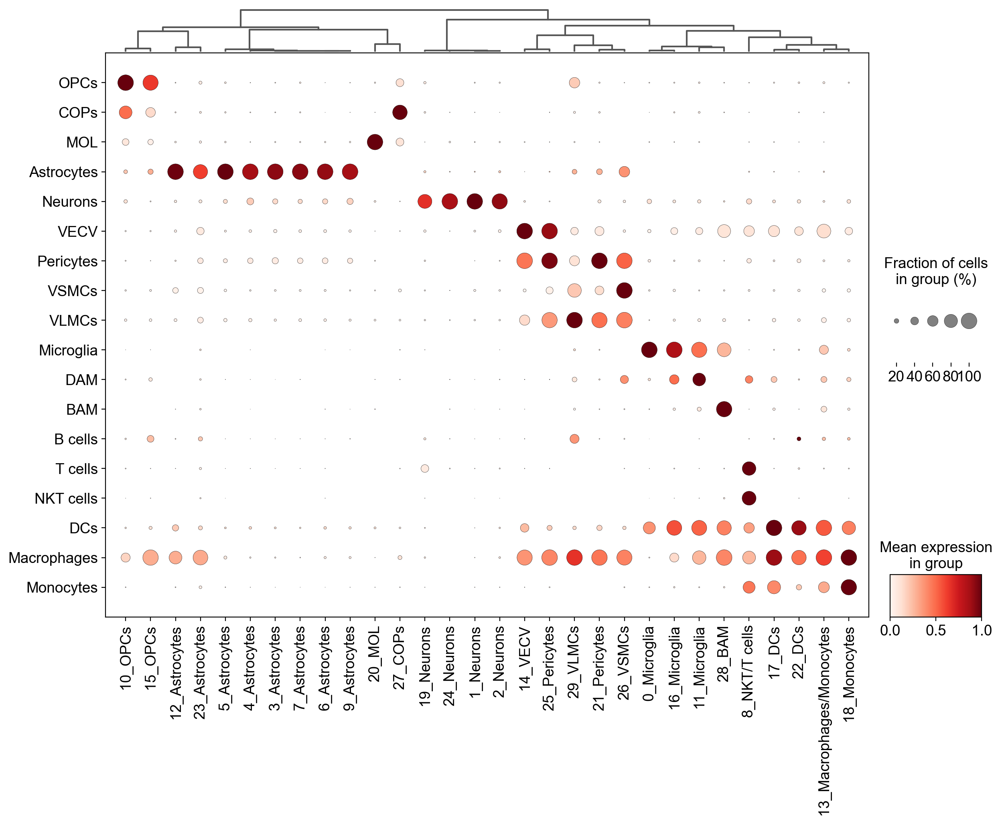

In [68]:
sc.pl.dotplot(adata_ctr_proce3dpi, ['OPCs','COPs', 'MOL',  'Astrocytes', 'Neurons','VECV','Pericytes', 'VSMCs', 'VLMCs',  'Microglia', 'DAM', 'BAM', 'B cells', 'T cells', 'NKT cells', 
                                    'DCs','Macrophages', 'Monocytes'], 'annotated2',  standard_scale='var', swap_axes=True, figsize=(14,10),
              var_group_rotation=90, dendrogram=True,)# save='markers_3dpi.png')

In [69]:
adata_ctr_proce3dpi.write(data_dir+today+'adata_ctr_proce3dpiIntact2.h5ad', compression='gzip') #230516adata_ctr_proce3dpiIntact2.h5ad

In [70]:
data_dir+today+'adata_ctr_proce3dpiIntact2.h5ad'

'/Volumes/Seagate_Exp/Paper_sc_analysis/notebooks/analysis_early_time_points/040522_corrected_notebooks/Revision/data/230516adata_ctr_proce3dpiIntact2.h5ad'